In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("paultimothymooney/chest-xray-pneumonia")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'chest-xray-pneumonia' dataset.
Path to dataset files: /kaggle/input/chest-xray-pneumonia


Using device: cpu
Class to idx: {'NORMAL': 0, 'PNEUMONIA': 1}
Train class counts: Counter({1: 3875, 0: 1341})
Val class counts: Counter({0: 8, 1: 8})
Test class counts: Counter({1: 390, 0: 234})
Sample label: 0


/tmp/ipython-input-3416386398.py:286: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)
/tmp/ipython-input-3416386398.py:331: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)


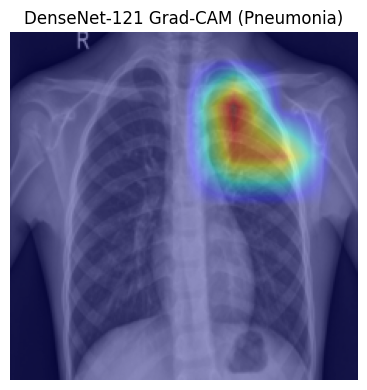

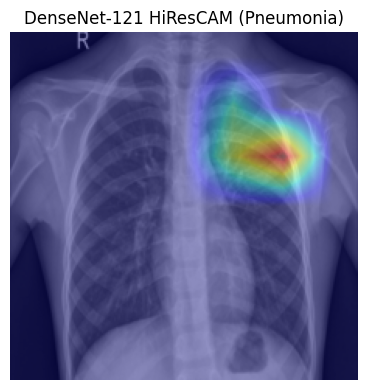

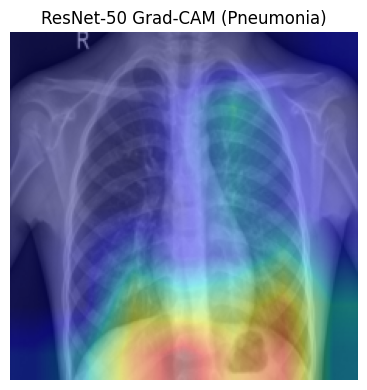

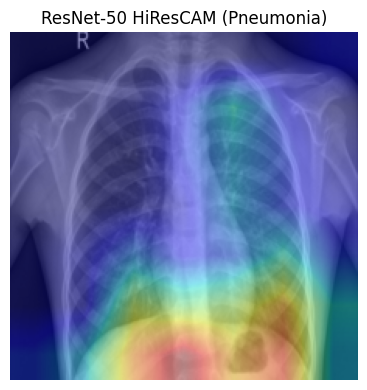

In [4]:
# ============================
# 0. IMPORTS & CONFIG
# ============================
import os
import types
from collections import Counter

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from contextlib import contextmanager

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Đường dẫn tới folder chứa chest_xray/
# Ví dụ: data_root = "/kaggle/input/chest-xray-pneumonia/chest_xray"
data_root = "/kaggle/input/chest-xray-pneumonia/chest_xray"

IMG_SIZE = 224
BATCH_SIZE = 4
LR = 1e-4
NUM_EPOCHS = 20      # bạn tự chỉnh
TRAIN_MODELS = False  # True nếu muốn train, False nếu chỉ dùng để infer + Grad-CAM


# ============================
# 1. DATASET & DATALOADERS
# ============================
transform_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_eval = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

train_dir = os.path.join(data_root, "train")
val_dir   = os.path.join(data_root, "val")
test_dir  = os.path.join(data_root, "test")

train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
val_dataset   = datasets.ImageFolder(val_dir,   transform=transform_eval)
test_dataset  = datasets.ImageFolder(test_dir,  transform=transform_eval)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

print("Class to idx:", train_dataset.class_to_idx)  # mong đợi: {'NORMAL': 0, 'PNEUMONIA': 1}

def count_class(dataset):
    labels = [label for _, label in dataset]
    return Counter(labels)

print("Train class counts:", count_class(train_dataset))
print("Val class counts:",   count_class(val_dataset))
print("Test class counts:",  count_class(test_dataset))


# ============================
# 2. MODEL DEFINITIONS
#    - DenseNet-121 (binary)
#    - ResNet-50 (binary)
# ============================
def get_densenet121_pneumonia(num_classes=1, use_imagenet_weights=True):
    if use_imagenet_weights:
        model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
    else:
        model = models.densenet121(weights=None)
    num_features = model.classifier.in_features
    model.classifier = nn.Linear(num_features, num_classes)
    return model


def get_resnet50_pneumonia(num_classes=1, use_imagenet_weights=True):
    if use_imagenet_weights:
        model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
    else:
        model = models.resnet50(weights=None)
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)
    return model


def remove_inplace_relu(m):
    if isinstance(m, nn.ReLU):
        m.inplace = False


# --- Khởi tạo DenseNet-121 ---
densenet = get_densenet121_pneumonia().to(device)
densenet.apply(remove_inplace_relu)

# Override forward để bỏ F.relu(..., inplace=True) trong torchvision
def densenet121_forward_no_inplace(self, x):
    features = self.features(x)
    out = F.relu(features, inplace=False)   # <-- sửa inplace=False
    out = F.adaptive_avg_pool2d(out, (1, 1))
    out = torch.flatten(out, 1)
    out = self.classifier(out)
    return out

densenet.forward = types.MethodType(densenet121_forward_no_inplace, densenet)
densenet.eval()

# --- Khởi tạo ResNet-50 ---
resnet = get_resnet50_pneumonia().to(device)
resnet.apply(remove_inplace_relu)
resnet.eval()

# Loss & optimizer (nếu train)
criterion = nn.BCEWithLogitsLoss()
optimizer_dn = torch.optim.Adam(densenet.parameters(), lr=LR)
optimizer_rn = torch.optim.Adam(resnet.parameters(),   lr=LR)


# ============================
# 3. TRAINING & EVALUATION
# ============================
def train_one_epoch(model, optimizer, loader):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)  # [B] -> [B,1]

        optimizer.zero_grad()
        logits = model(images)            # [B,1]
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = (torch.sigmoid(logits) >= 0.5).long()
        correct += (preds.cpu().numpy() == labels.cpu().numpy()).sum()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc


@torch.no_grad()
def eval_model(model, loader):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)

        logits = model(images)
        loss = criterion(logits, labels)

        running_loss += loss.item() * images.size(0)
        preds = (torch.sigmoid(logits) >= 0.5).long()
        correct += (preds.cpu().numpy() == labels.cpu().numpy()).sum()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc


if TRAIN_MODELS:
    print("=== Train DenseNet-121 ===")
    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(densenet, optimizer_dn, train_loader)
        val_loss, val_acc = eval_model(densenet, val_loader)
        print(f"[DN] Epoch {epoch+1}/{NUM_EPOCHS} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    torch.save(densenet.state_dict(), "densenet121_pneumonia.pth")

    print("=== Train ResNet-50 ===")
    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(resnet, optimizer_rn, train_loader)
        val_loss, val_acc = eval_model(resnet, val_loader)
        print(f"[RN] Epoch {epoch+1}/{NUM_EPOCHS} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    torch.save(resnet.state_dict(), "resnet50_pneumonia.pth")

# Nếu bạn đã train trước đó, có thể load:
# densenet.load_state_dict(torch.load("densenet121_pneumonia.pth", map_location=device))
# resnet.load_state_dict(torch.load("resnet50_pneumonia.pth", map_location=device))
# densenet.eval(); resnet.eval()


# ============================
# 4. HOOK & CAM IMPLEMENTATION
# ============================
class FeatureExtractor2D:
    """
    Hook forward + backward cho layer tích chập (2D).
    Dùng với DenseNet-121: target_layer = model.features hoặc model.features[-1]
    Dùng với ResNet-50:   target_layer = model.layer4[-1]
    """
    def __init__(self, target_module: nn.Module):
        self.target_module = target_module
        self.activations = None
        self.gradients = None
        self._fwd_handle = target_module.register_forward_hook(self._forward_hook)
        self._bwd_handle = target_module.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        # clone để tránh view + inplace issues
        self.activations = output.detach().clone()

    def _backward_hook(self, module, grad_input, grad_output):
        # grad_output[0] là gradient wrt output của module
        self.gradients = grad_output[0].detach().clone()

    def close(self):
        self._fwd_handle.remove()
        self._bwd_handle.remove()


@contextmanager
def eval_mode(model):
    was_training = model.training
    try:
        model.eval()
        yield model
    finally:
        if was_training:
            model.train()


class GradCAM2D:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.extractor = FeatureExtractor2D(target_layer)

    def __del__(self):
        self.extractor.close()

    def _compute_cam(self, activations, gradients):
        """
        activations: [1, C, H, W]
        gradients:   [1, C, H, W]
        """
        N, C, H, W = gradients.shape
        alpha = gradients.view(N, C, -1).mean(dim=2)   # [1, C]
        alpha = alpha.view(N, C, 1, 1)                 # [1, C, 1, 1]
        weighted = alpha * activations                 # [1, C, H, W]
        cam = weighted.sum(dim=1, keepdim=True)        # [1, 1, H, W]
        cam = F.relu(cam)
        return cam

    def generate_cam(self, input_image: torch.Tensor, pneumonia_class=True, normalize=True):
        """
        input_image: [1, 3, H, W]
        pneumonia_class: True = giải thích lớp viêm phổi (logit dương)
        """
        self.model.zero_grad()
        with eval_mode(self.model):
            logits = self.model(input_image)  # [1,1]

        # Với binary (1 logit), ta xem logit đó là score của lớp VIÊM PHỔI
        score = logits[0, 0]
        if not pneumonia_class:
            score = -score   # nếu muốn giải thích lớp NORMAL

        score.backward(retain_graph=True)

        activations = self.extractor.activations
        gradients   = self.extractor.gradients
        cam = self._compute_cam(activations, gradients)

        # resize về size input
        _, _, H_in, W_in = input_image.shape
        cam = F.interpolate(cam, size=(H_in, W_in),
                            mode='bilinear', align_corners=False)

        if normalize:
            cam_min, cam_max = cam.min(), cam.max()
            if cam_max > cam_min:
                cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)

        return cam.detach()  # [1,1,H,W]


class HiResCAM2D:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.extractor = FeatureExtractor2D(target_layer)

    def __del__(self):
        self.extractor.close()

    def _compute_cam(self, activations, gradients):
        """
        HiResCAM: sum_c(grad_c * act_c)
        """
        prod = gradients * activations            # [1, C, H, W]
        cam = prod.sum(dim=1, keepdim=True)       # [1, 1, H, W]
        cam = F.relu(cam)
        return cam

    def generate_cam(self, input_image: torch.Tensor, pneumonia_class=True, normalize=True):
        self.model.zero_grad()
        with eval_mode(self.model):
            logits = self.model(input_image)  # [1,1]

        score = logits[0, 0]
        if not pneumonia_class:
            score = -score

        score.backward(retain_graph=True)

        activations = self.extractor.activations
        gradients   = self.extractor.gradients
        cam = self._compute_cam(activations, gradients)

        _, _, H_in, W_in = input_image.shape
        cam = F.interpolate(cam, size=(H_in, W_in),
                            mode='bilinear', align_corners=False)

        if normalize:
            cam_min, cam_max = cam.min(), cam.max()
            if cam_max > cam_min:
                cam = (cam - cam_min) / (cam_max - cam_min + 1e-8)

        return cam.detach()  # [1,1,H,W]


# ============================
# 5. VISUALIZATION UTILITIES
# ============================
def denormalize_img(tensor):
    """
    Ngược lại transform.Normalize để hiển thị ảnh.
    tensor: [3,H,W]
    """
    mean = torch.tensor([0.485, 0.456, 0.406], device=tensor.device).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=tensor.device).view(3,1,1)
    img = tensor * std + mean
    img = torch.clamp(img, 0, 1)
    return img

def show_overlay_from_tensor(input_tensor, cam, title="CAM"):
    """
    input_tensor: [1,3,H,W] (đã normalize)
    cam:          [1,1,H,W] (0-1)
    """
    img = denormalize_img(input_tensor[0]).permute(1,2,0).detach().cpu().numpy()  # [H,W,3]
    cam_np = cam[0,0].detach().cpu().numpy()                                      # [H,W]

    plt.figure(figsize=(5,4))
    plt.imshow(img, cmap='gray')
    plt.imshow(cam_np, cmap='jet', alpha=0.4)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


# ============================
# 6. DEMO: LẤY 1 ẢNH TEST & SINH CAM
# ============================
# Lấy 1 mẫu từ test_loader
test_iter = iter(test_loader)
sample_imgs, sample_labels = next(test_iter)

img0 = sample_imgs[0:1].to(device)   # [1,3,H,W]
label0 = sample_labels[0].item()     # 0 = NORMAL, 1 = PNEUMONIA
print("Sample label:", label0)

# CAM cho DenseNet-121
target_layer_dn = densenet.features  # hoặc densenet.features[-1]
grad_cam_dn  = GradCAM2D(densenet, target_layer_dn)
hires_cam_dn = HiResCAM2D(densenet, target_layer_dn)

grad_cam_map_dn  = grad_cam_dn.generate_cam(img0, pneumonia_class=True)
hires_cam_map_dn = hires_cam_dn.generate_cam(img0, pneumonia_class=True)

show_overlay_from_tensor(img0, grad_cam_map_dn,  title="DenseNet-121 Grad-CAM (Pneumonia)")
show_overlay_from_tensor(img0, hires_cam_map_dn, title="DenseNet-121 HiResCAM (Pneumonia)")

# CAM cho ResNet-50
target_layer_rn = resnet.layer4[-1]
grad_cam_rn  = GradCAM2D(resnet, target_layer_rn)
hires_cam_rn = HiResCAM2D(resnet, target_layer_rn)

grad_cam_map_rn  = grad_cam_rn.generate_cam(img0, pneumonia_class=True)
hires_cam_map_rn = hires_cam_rn.generate_cam(img0, pneumonia_class=True)

show_overlay_from_tensor(img0, grad_cam_map_rn,  title="ResNet-50 Grad-CAM (Pneumonia)")
show_overlay_from_tensor(img0, hires_cam_map_rn, title="ResNet-50 HiResCAM (Pneumonia)")


In [5]:
import random

# Lấy toàn bộ ảnh test
all_imgs = []
for img_path, label in test_dataset.imgs:
    all_imgs.append((img_path, label))

# Chọn ngẫu nhiên 20 ảnh
random.seed(42)
sample_imgs_20 = random.sample(all_imgs, 20)

len(sample_imgs_20)


20

In [6]:
import os

output_dir = "cam_results_20"
os.makedirs(output_dir, exist_ok=True)

def process_one_image(img_path, model, target_layer, model_name, index):
    # Load ảnh
    pil_img = Image.open(img_path).convert("RGB")
    input_tensor = transform_eval(pil_img).unsqueeze(0).to(device)

    # Grad-CAM + HiResCAM
    grad_cam = GradCAM2D(model, target_layer)
    hires_cam = HiResCAM2D(model, target_layer)

    cam_grad  = grad_cam.generate_cam(input_tensor, pneumonia_class=True)
    cam_hires = hires_cam.generate_cam(input_tensor, pneumonia_class=True)

    # Save hình
    img_np = denormalize_img(input_tensor[0]).permute(1,2,0).cpu().numpy()
    cam_grad_np  = cam_grad[0,0].cpu().numpy()
    cam_hires_np = cam_hires[0,0].cpu().numpy()

    # Grad-CAM overlay
    plt.figure(figsize=(5,4))
    plt.imshow(img_np)
    plt.imshow(cam_grad_np, cmap='jet', alpha=0.4)
    plt.axis("off")
    plt.title(f"{model_name} Grad-CAM")
    plt.savefig(f"{output_dir}/{index}_{model_name}_gradcam.png", dpi=150)
    plt.close()

    # HiResCAM overlay
    plt.figure(figsize=(5,4))
    plt.imshow(img_np)
    plt.imshow(cam_hires_np, cmap='jet', alpha=0.4)
    plt.axis("off")
    plt.title(f"{model_name} HiResCAM")
    plt.savefig(f"{output_dir}/{index}_{model_name}_hirescam.png", dpi=150)
    plt.close()


In [7]:
target_layer_dn = densenet.features        # DenseNet-121
target_layer_rn = resnet.layer4[-1]        # ResNet-50


In [8]:
for idx, (img_path, label) in enumerate(sample_imgs_20):
    print(f"Processing {idx+1}/20:", img_path)

    # DenseNet-121
    process_one_image(
        img_path=img_path,
        model=densenet,
        target_layer=target_layer_dn,
        model_name="DenseNet121",
        index=idx
    )

    # ResNet-50
    process_one_image(
        img_path=img_path,
        model=resnet,
        target_layer=target_layer_rn,
        model_name="ResNet50",
        index=idx
    )


Processing 1/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0146-0001.jpeg


/tmp/ipython-input-3416386398.py:286: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)
/tmp/ipython-input-3416386398.py:331: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)


Processing 2/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0033-0001-0002.jpeg
Processing 3/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person117_bacteria_556.jpeg
Processing 4/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person104_bacteria_492.jpeg
Processing 5/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0374-0001-0002.jpeg
Processing 6/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0251-0001.jpeg
Processing 7/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0120-0001.jpeg
Processing 8/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person78_bacteria_378.jpeg
Processing 9/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0073-0001.jpeg
Processing 10/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person90_bacteria_443.jpeg
Processing 11/20: /kaggle/input/chest-xray-pneumonia/chest_xray/test/P

In [13]:
def visualize_cam_for_one_image(img_path, densenet, resnet,
                                target_layer_dn, target_layer_rn,
                                index, label_str=None):
    # 1) Load ảnh & preprocess
    pil_img = Image.open(img_path).convert("RGB")
    input_tensor = transform_eval(pil_img).unsqueeze(0).to(device)  # [1,3,H,W]

    # 2) Tạo Grad-CAM & HiResCAM cho DenseNet
    grad_cam_dn  = GradCAM2D(densenet, target_layer_dn)
    hires_cam_dn = HiResCAM2D(densenet, target_layer_dn)

    cam_grad_dn  = grad_cam_dn.generate_cam(input_tensor, pneumonia_class=True)   # [1,1,H,W]
    cam_hires_dn = hires_cam_dn.generate_cam(input_tensor, pneumonia_class=True)  # [1,1,H,W]

    # 3) Tạo Grad-CAM & HiResCAM cho ResNet
    grad_cam_rn  = GradCAM2D(resnet, target_layer_rn)
    hires_cam_rn = HiResCAM2D(resnet, target_layer_rn)

    cam_grad_rn  = grad_cam_rn.generate_cam(input_tensor, pneumonia_class=True)
    cam_hires_rn = hires_cam_rn.generate_cam(input_tensor, pneumonia_class=True)

    # 4) Chuẩn bị ảnh gốc & CAM dưới dạng numpy
    img_np = denormalize_img(input_tensor[0]).permute(1, 2, 0).detach().cpu().numpy()
    cam_grad_dn_np  = cam_grad_dn[0, 0].detach().cpu().numpy()
    cam_hires_dn_np = cam_hires_dn[0, 0].detach().cpu().numpy()
    cam_grad_rn_np  = cam_grad_rn[0, 0].detach().cpu().numpy()
    cam_hires_rn_np = cam_hires_rn[0, 0].detach().cpu().numpy()

    # 5) Vẽ 1 figure gồm 5 cột
    plt.figure(figsize=(18, 4))

    # Cột 1: Ảnh gốc
    plt.subplot(1, 5, 1)
    plt.imshow(img_np)
    title0 = f"Image {index}"
    if label_str is not None:
        title0 += f" ({label_str})"
    plt.title(title0)
    plt.axis("off")

    # Cột 2: DenseNet Grad-CAM
    plt.subplot(1, 5, 2)
    plt.imshow(img_np)
    plt.imshow(cam_grad_dn_np, cmap='jet', alpha=0.4)
    plt.title("DenseNet-121\nGrad-CAM")
    plt.axis("off")

    # Cột 3: DenseNet HiResCAM
    plt.subplot(1, 5, 3)
    plt.imshow(img_np)
    plt.imshow(cam_hires_dn_np, cmap='jet', alpha=0.4)
    plt.title("DenseNet-121\nHiResCAM")
    plt.axis("off")

    # Cột 4: ResNet Grad-CAM
    plt.subplot(1, 5, 4)
    plt.imshow(img_np)
    plt.imshow(cam_grad_rn_np, cmap='jet', alpha=0.4)
    plt.title("ResNet-50\nGrad-CAM")
    plt.axis("off")

    # Cột 5: ResNet HiResCAM
    plt.subplot(1, 5, 5)
    plt.imshow(img_np)
    plt.imshow(cam_hires_rn_np, cmap='jet', alpha=0.4)
    plt.title("ResNet-50\nHiResCAM")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


class_idx_to_name: {0: 'NORMAL', 1: 'PNEUMONIA'}
=== Image 0 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0146-0001.jpeg ===


/tmp/ipython-input-3416386398.py:286: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)
/tmp/ipython-input-3416386398.py:331: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)


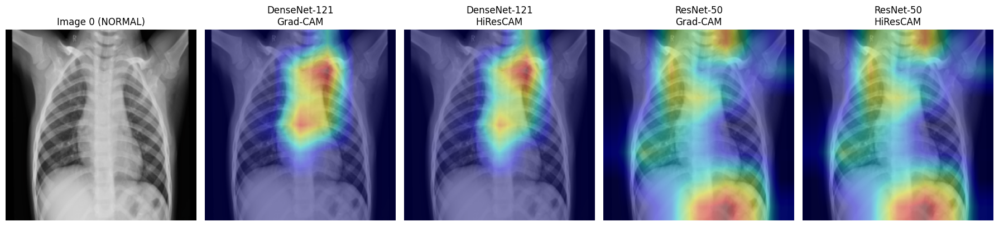

=== Image 1 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0033-0001-0002.jpeg ===


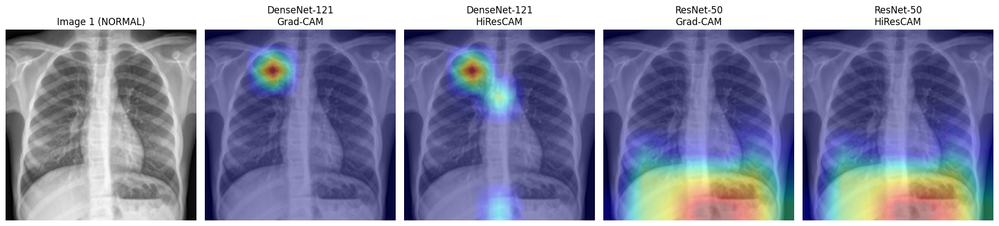

=== Image 2 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person117_bacteria_556.jpeg ===


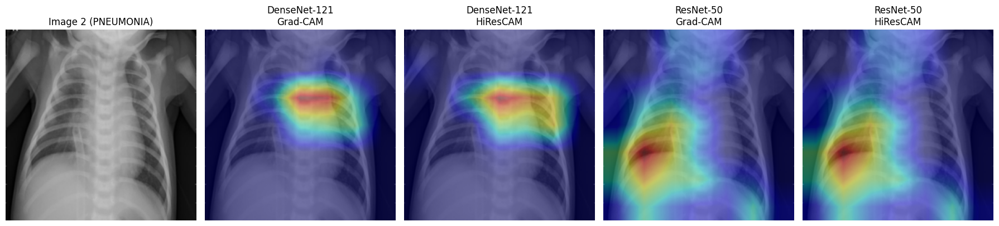

=== Image 3 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person104_bacteria_492.jpeg ===


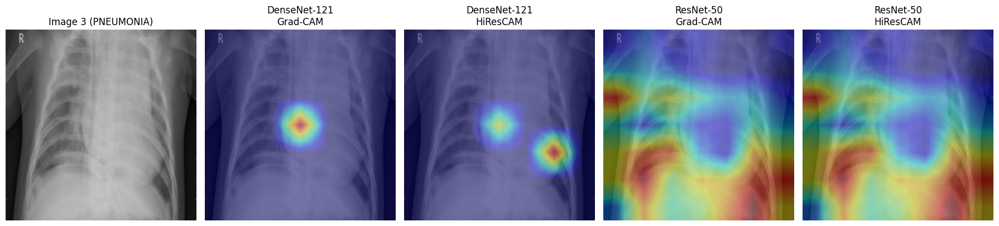

=== Image 4 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0374-0001-0002.jpeg ===


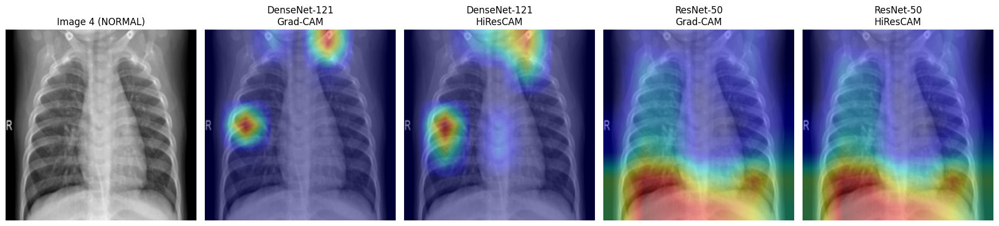

=== Image 5 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0251-0001.jpeg ===


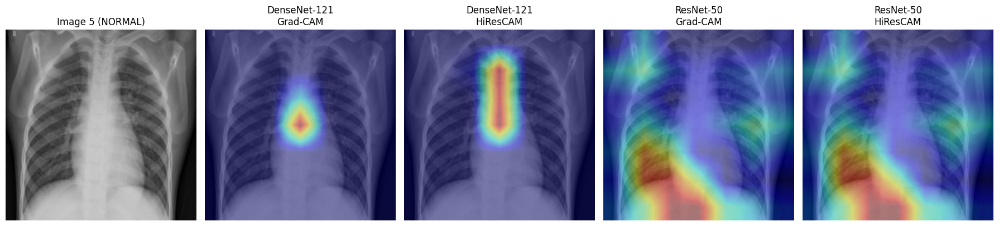

=== Image 6 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0120-0001.jpeg ===


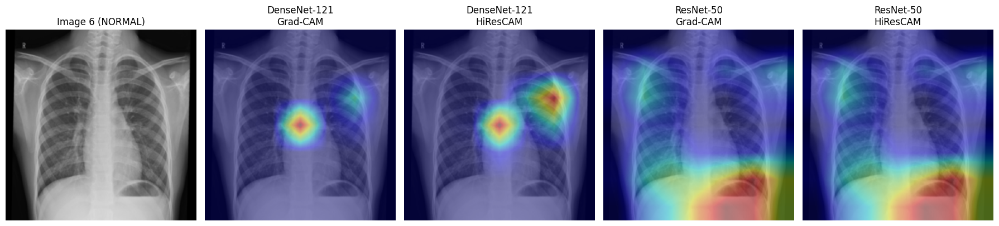

=== Image 7 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person78_bacteria_378.jpeg ===


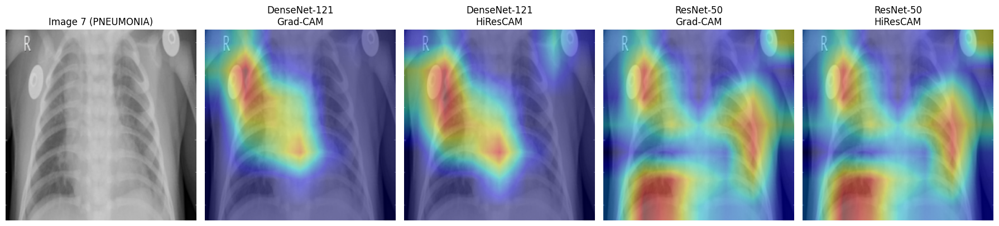

=== Image 8 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0073-0001.jpeg ===


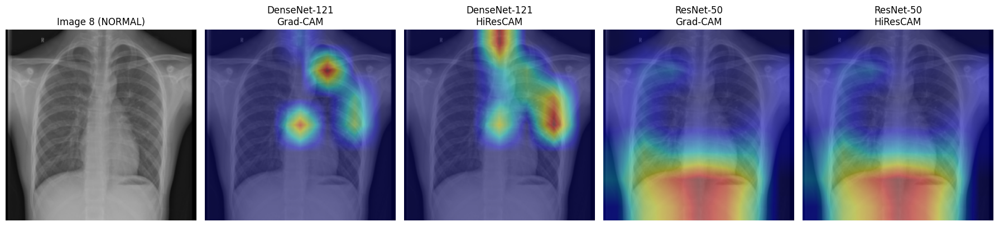

=== Image 9 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person90_bacteria_443.jpeg ===


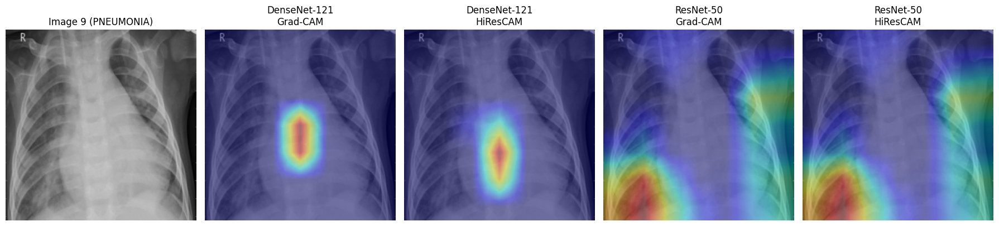

=== Image 10 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person1637_virus_2834.jpeg ===


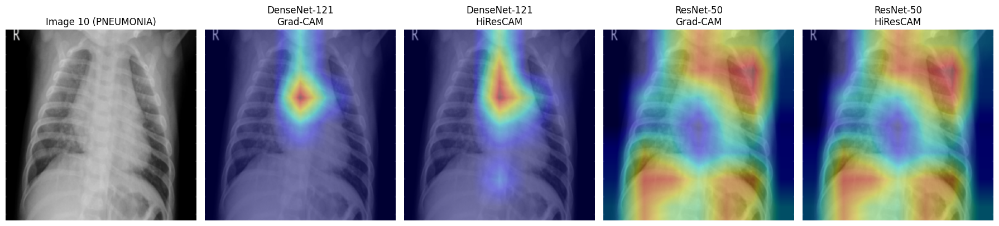

=== Image 11 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0043-0001.jpeg ===


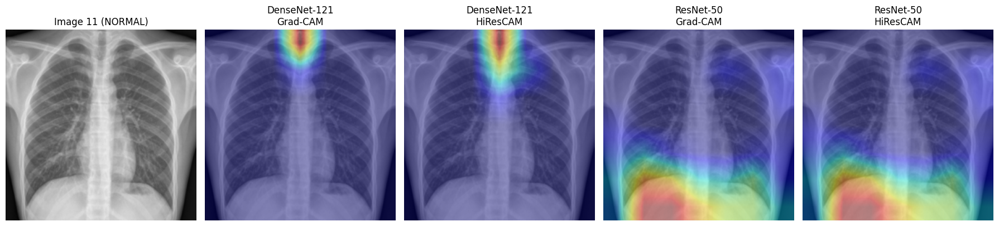

=== Image 12 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0039-0001.jpeg ===


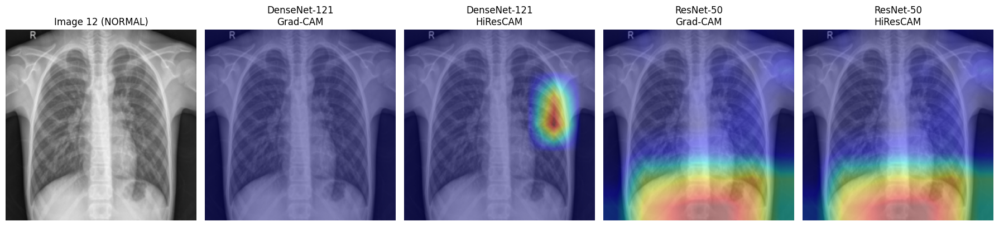

=== Image 13 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0096-0001.jpeg ===


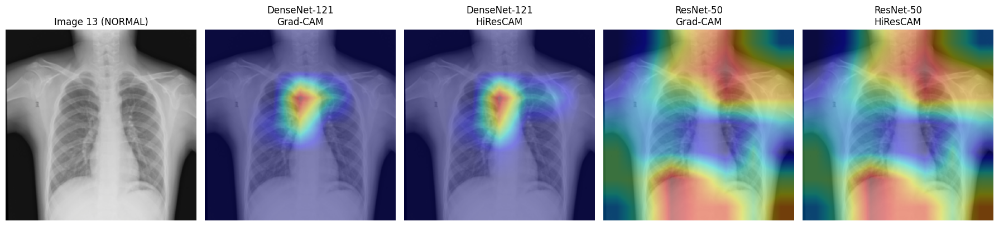

=== Image 14 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/NORMAL2-IM-0369-0001.jpeg ===


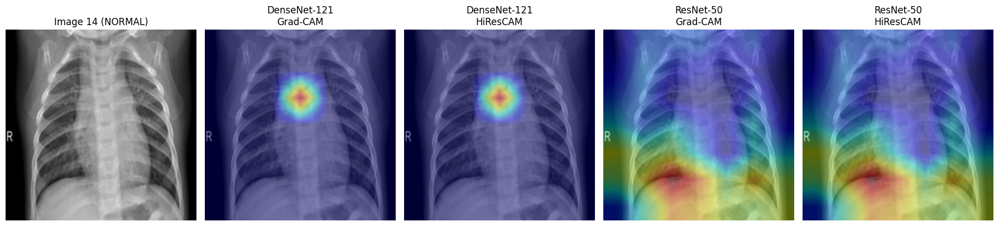

=== Image 15 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person100_bacteria_480.jpeg ===


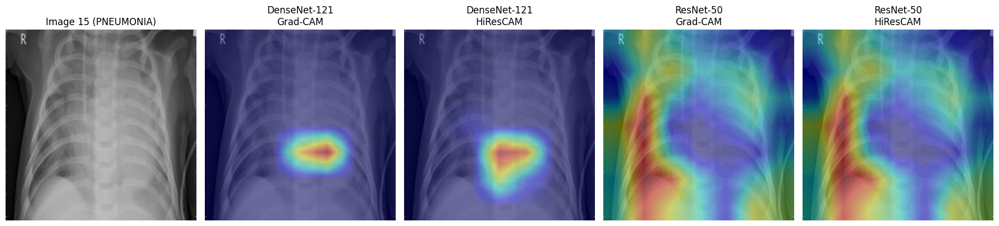

=== Image 16 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person3_virus_15.jpeg ===


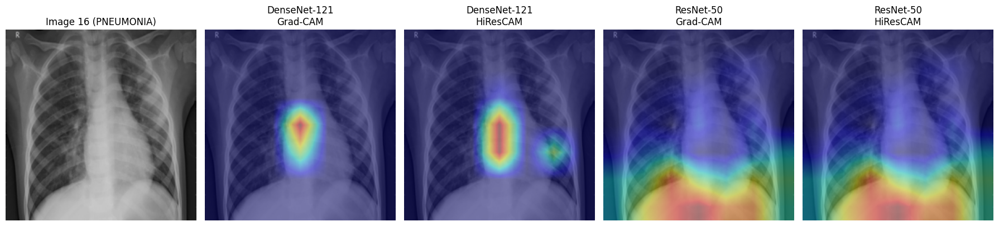

=== Image 17 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person94_bacteria_458.jpeg ===


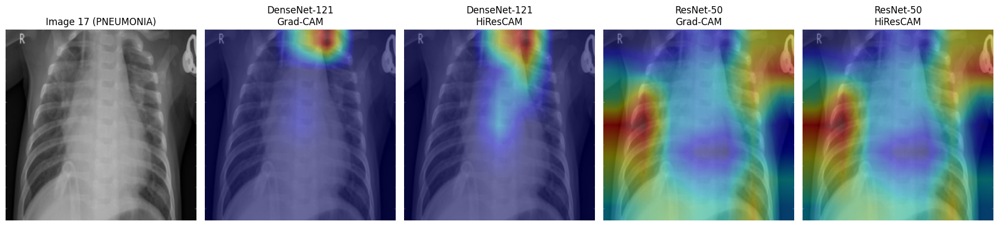

=== Image 18 | Label: NORMAL | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0035-0001.jpeg ===


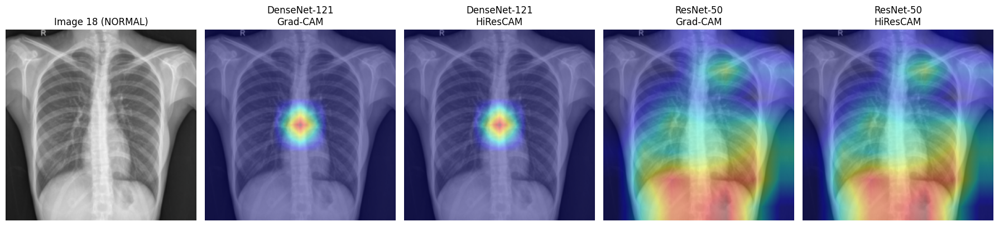

=== Image 19 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person81_bacteria_396.jpeg ===


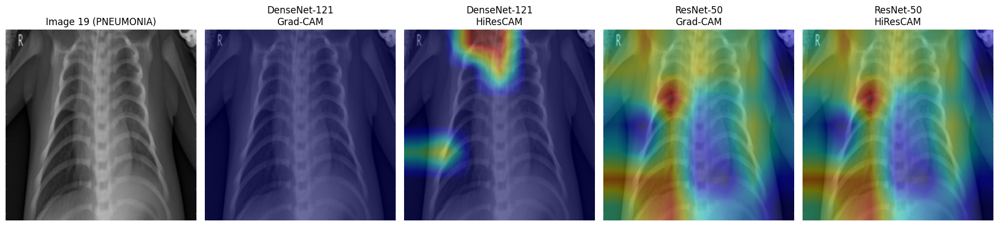

In [10]:
# sample_imgs_20: list 20 phần tử (img_path, label_int)
# ví dụ tạo lại nếu cần:
# all_imgs = test_dataset.imgs   # list (path, label)
# import random
# random.seed(42)
# sample_imgs_20 = random.sample(all_imgs, 20)

class_idx_to_name = {v: k for k, v in test_dataset.class_to_idx.items()}
print("class_idx_to_name:", class_idx_to_name)

target_layer_dn = densenet.features
target_layer_rn = resnet.layer4[-1]

for idx, ("img_path", label_int) in enumerate(sample_imgs_20):
    label_str = class_idx_to_name[label_int]  # 'NORMAL' hoặc 'PNEUMONIA'
    print(f"=== Image {idx} | Label: {label_str} | Path: {img_path} ===")
    visualize_cam_for_one_image(
        img_path=img_path,
        densenet=densenet,
        resnet=resnet,
        target_layer_dn=target_layer_dn,
        target_layer_rn=target_layer_rn,
        index=idx,
        label_str=label_str
    )


In [11]:
# Lấy chỉ số label tương ứng với PNEUMONIA
print(test_dataset.class_to_idx)  # ví dụ: {'NORMAL': 0, 'PNEUMONIA': 1}
pneumonia_idx = test_dataset.class_to_idx['PNEUMONIA']

# Lọc tất cả ảnh PNEUMONIA trong tập test
pneumonia_imgs_test = [
    (img_path, label)
    for img_path, label in test_dataset.imgs
    if label == pneumonia_idx
]

len(pneumonia_imgs_test)


{'NORMAL': 0, 'PNEUMONIA': 1}


390

class_idx_to_name: {0: 'NORMAL', 1: 'PNEUMONIA'}
=== Pneumonia Image 0 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person78_bacteria_382.jpeg ===


/tmp/ipython-input-3416386398.py:286: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)
/tmp/ipython-input-3416386398.py:331: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward(retain_graph=True)


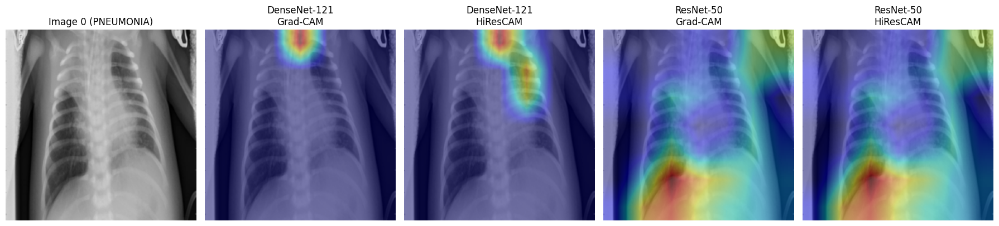

=== Pneumonia Image 1 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person120_bacteria_571.jpeg ===


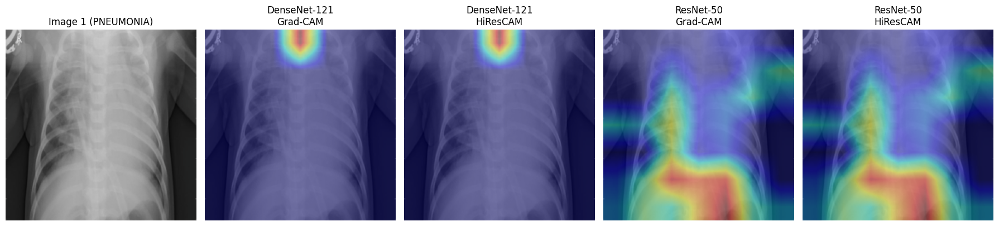

=== Pneumonia Image 2 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person103_bacteria_488.jpeg ===


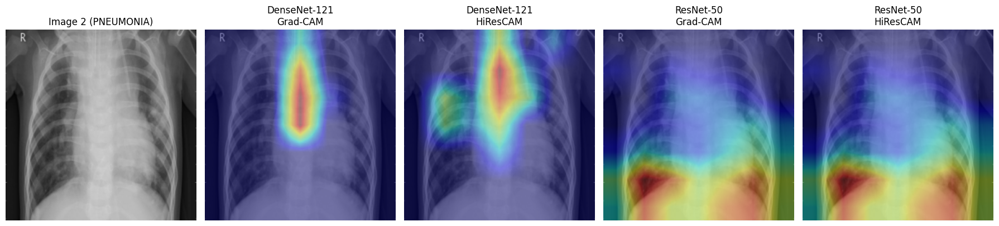

=== Pneumonia Image 3 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person93_bacteria_454.jpeg ===


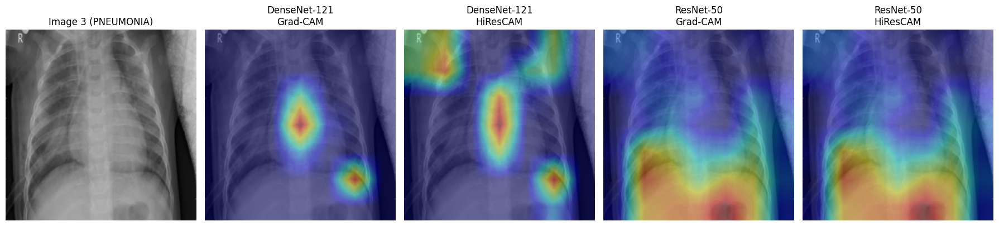

=== Pneumonia Image 4 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person147_bacteria_705.jpeg ===


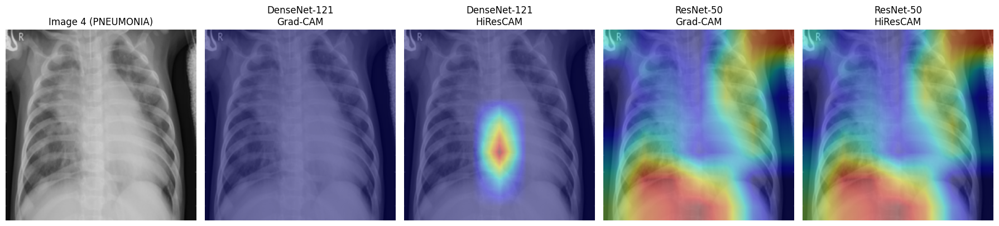

=== Pneumonia Image 5 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person141_bacteria_676.jpeg ===


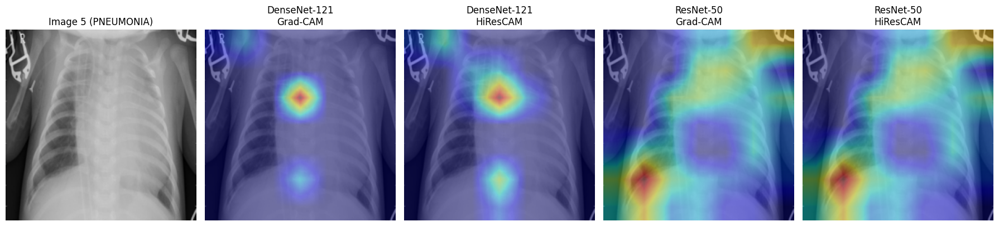

=== Pneumonia Image 6 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person138_bacteria_658.jpeg ===


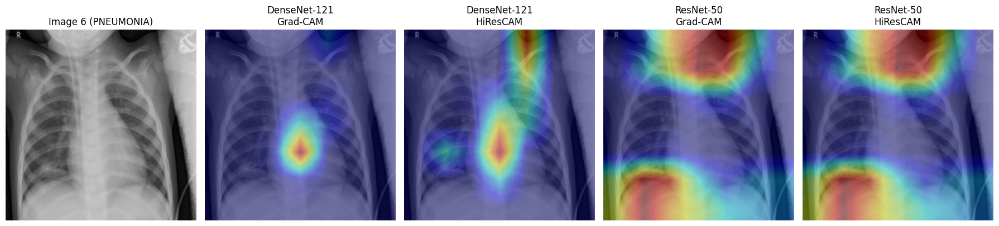

=== Pneumonia Image 7 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person123_bacteria_587.jpeg ===


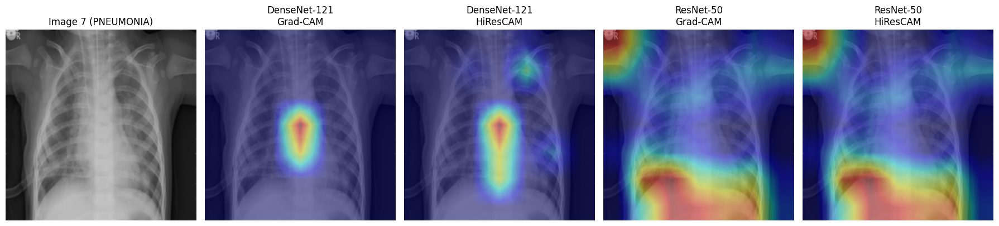

=== Pneumonia Image 8 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person92_bacteria_451.jpeg ===


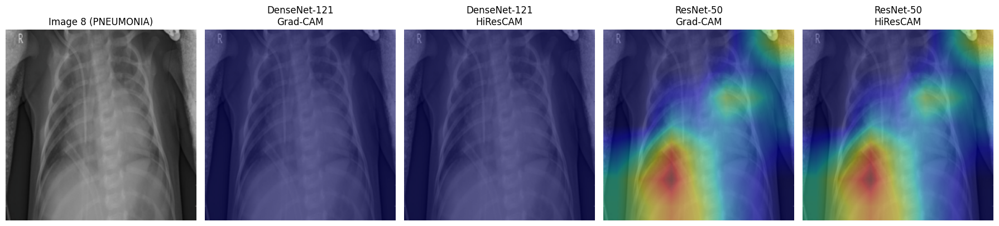

=== Pneumonia Image 9 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person119_bacteria_566.jpeg ===


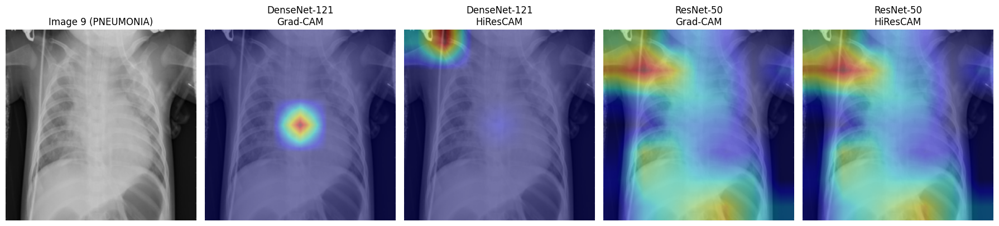

=== Pneumonia Image 10 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person82_bacteria_405.jpeg ===


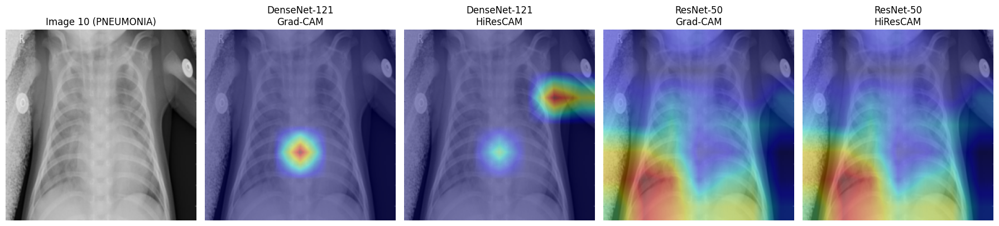

=== Pneumonia Image 11 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person37_virus_82.jpeg ===


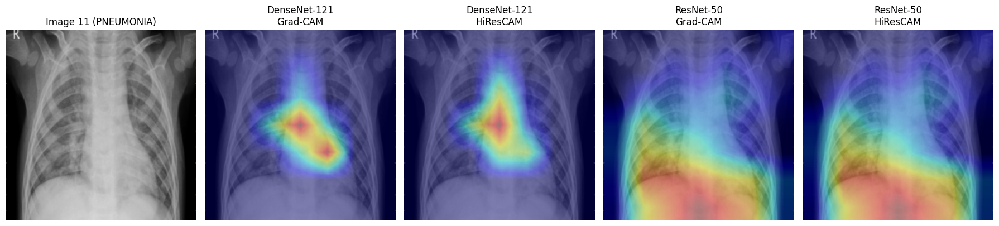

=== Pneumonia Image 12 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person114_bacteria_545.jpeg ===


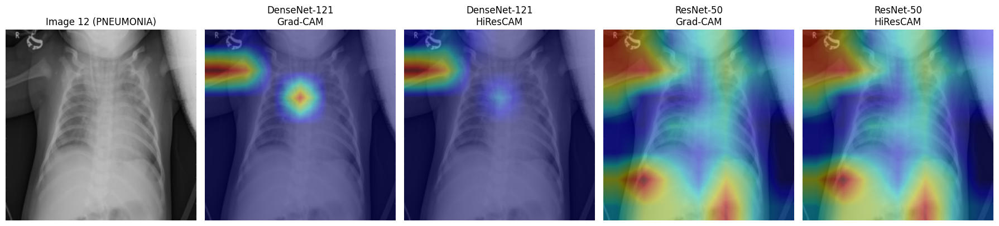

=== Pneumonia Image 13 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person54_virus_109.jpeg ===


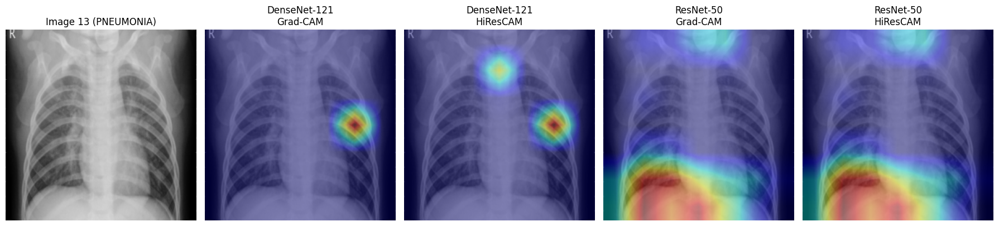

=== Pneumonia Image 14 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person1660_virus_2869.jpeg ===


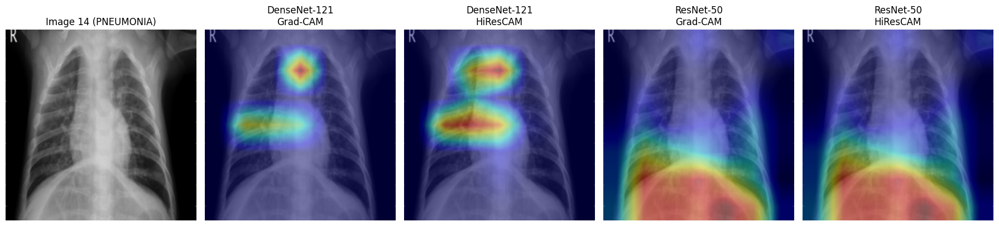

=== Pneumonia Image 15 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person104_bacteria_492.jpeg ===


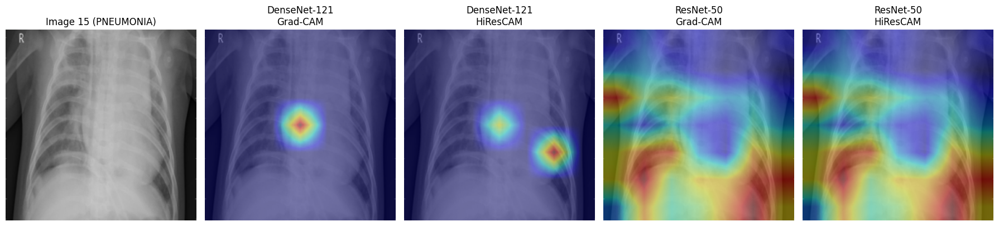

=== Pneumonia Image 16 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person104_bacteria_491.jpeg ===


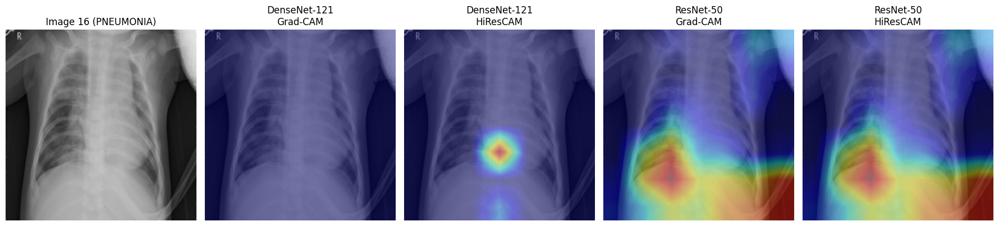

=== Pneumonia Image 17 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person117_bacteria_556.jpeg ===


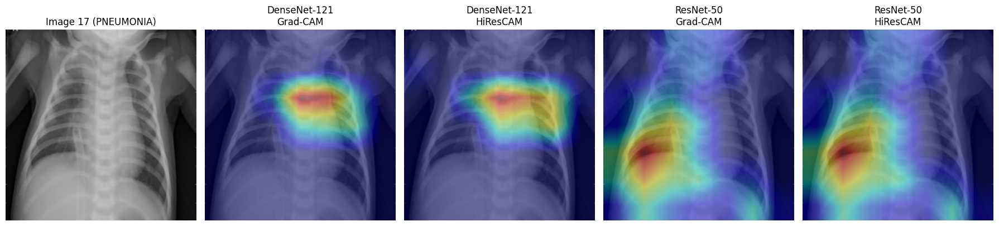

=== Pneumonia Image 18 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person136_bacteria_654.jpeg ===


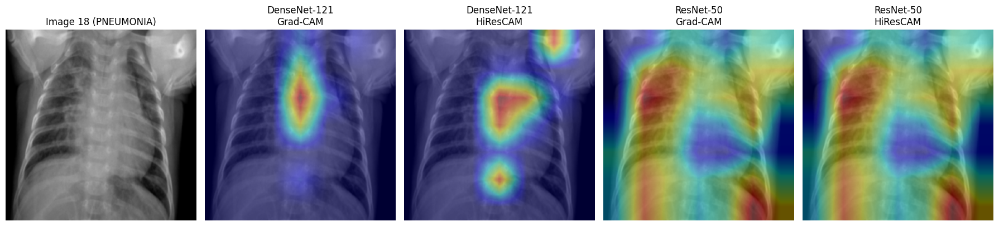

=== Pneumonia Image 19 | Label: PNEUMONIA | Path: /kaggle/input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person139_bacteria_664.jpeg ===


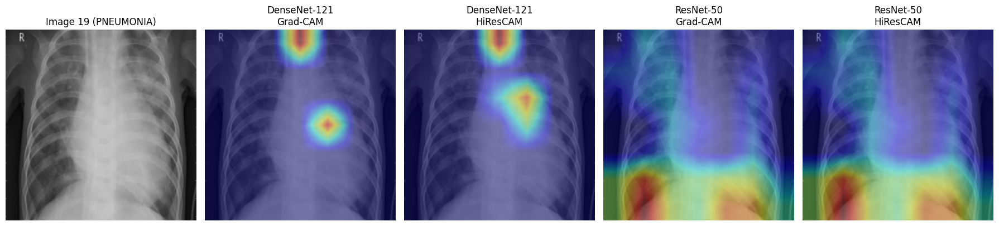

In [12]:
import random

random.seed(42)
sample_pneu_20 = random.sample(pneumonia_imgs_test, min(20, len(pneumonia_imgs_test)))

class_idx_to_name = {v: k for k, v in test_dataset.class_to_idx.items()}
print("class_idx_to_name:", class_idx_to_name)

target_layer_dn = densenet.features
target_layer_rn = resnet.layer4[-1]

for idx, (img_path, label_int) in enumerate(sample_pneu_20):
    label_str = class_idx_to_name[label_int]  # sẽ là 'PNEUMONIA'
    print(f"=== Pneumonia Image {idx} | Label: {label_str} | Path: {img_path} ===")
    visualize_cam_for_one_image(
        img_path=img_path,
        densenet=densenet,
        resnet=resnet,
        target_layer_dn=target_layer_dn,
        target_layer_rn=target_layer_rn,
        index=idx,
        label_str=label_str
    )
